In [1]:
from pytube import YouTube 

# where to save 
SAVE_PATH = "download/" #to_do 

# link of the video to be downloaded (Varali Raga)
link = "https://www.youtube.com/watch?v=3VGU3J4nHOA" 
# link = "https://www.youtube.com/watch?v=t7GjvA-0aoE"


try: 
    # object creation using YouTube 
    yt = YouTube(link) 
except: 
    #to handle exception 
    print("Connection Error") 

# Get all streams and filter for mp4 files
mp4_streams = yt.streams.filter(file_extension='mp4').all()

# get the video with the lowest resolution
d_video = mp4_streams[0]

try: 
    # downloading the video 
    d_video.download(output_path=SAVE_PATH, filename='video.mp4')
    print('Video downloaded successfully!')
except Exception as e: 
    print("Error: ",e)

/tmp/ipykernel_24858/1250925189.py:19: DeprecationWarning: Call to deprecated function all (This object can be treated as a list, all() is useless).
  mp4_streams = yt.streams.filter(file_extension='mp4').all()


Video downloaded successfully!


In [2]:
from pytube import YouTube 
from moviepy.editor import AudioFileClip

def MP4ToMP3(mp4, mp3):
    try:
        FILE_TO_CONVERT = AudioFileClip(mp4)
        FILE_TO_CONVERT.write_audiofile(mp3, codec='libmp3lame')  # Specify the codec
        FILE_TO_CONVERT.close()
        print("Conversion successful!")
    except Exception as e:
        print("An error occurred:", e)

# Paths to the input MP4 video and output MP3 audio
VIDEO_FILE_PATH = SAVE_PATH+"video.mp4"
AUDIO_FILE_PATH = SAVE_PATH+"audio.mp3"

# Convert MP4 to MP3
MP4ToMP3(VIDEO_FILE_PATH, AUDIO_FILE_PATH)


MoviePy - Writing audio in download/audio.mp3


MoviePy - Done.
Conversion successful!


In [3]:
import math, librosa, numpy as np

segment_features = []
y, sr = librosa.load(AUDIO_FILE_PATH, mono=True)
dur = librosa.get_duration(y=y, sr=sr)
n_samples = ceiling_x = math.ceil(dur/30.0)

# Define a function to detect beats
def detect_beats(y, sr):
	tempo, beats = librosa.beat.beat_track(y=y, sr=sr)
	return beats

for i in range(n_samples):
	start_time = i * 30 
	end_time = min((i + 1) * 30, dur)  
	start_sample = int(start_time * sr)
	end_sample = int(end_time * sr)
	y_segment = y[start_sample:end_sample]
	
melody, _ = librosa.core.piptrack(y=y_segment, sr=sr)  # Extract melody using Librosa's melody function
midi_notes = librosa.hz_to_midi(melody[melody > 0]) # Convert pitch contour to MIDI notes
beats = detect_beats(y_segment, sr) # Detect beats in the audio
beat_times = librosa.frames_to_time(beats, sr=sr) # Convert beat timings to time stamps	
chromagram = librosa.feature.chroma_cqt(y=y_segment, sr=sr) # Extract chroma features for harmonic content
tonal_center = np.argmax(np.mean(chromagram, axis=1)) # Identify tonal center using chroma features

    # Extract features for the segment
    rmse = librosa.feature.rms(y=y_segment)[0]
    chroma_stft = librosa.feature.chroma_stft(y=y_segment, sr=sr)
    spec_cent = librosa.feature.spectral_centroid(y=y_segment, sr=sr)
    spec_bw = librosa.feature.spectral_bandwidth(y=y_segment, sr=sr)
    rolloff = librosa.feature.spectral_rolloff(y=y_segment, sr=sr)
    zcr = librosa.feature.zero_crossing_rate(y_segment)
    mfcc = librosa.feature.mfcc(y=y_segment, sr=sr)
    
    # Create a row of features for the segment
    filename = AUDIO_FILE_PATH + '-' + str(i + 1)
    data = [filename, np.mean(rmse), np.mean(chroma_stft), np.mean(spec_cent), np.mean(spec_bw),
            np.mean(rolloff), np.mean(zcr), np.mean(mfcc[0]), np.mean(mfcc[1]), np.mean(mfcc[2]),
            np.mean(mfcc[3]), np.mean(mfcc[4]), np.mean(mfcc[5]), np.mean(mfcc[6]), np.mean(mfcc[7]),
            np.mean(mfcc[8]), np.mean(mfcc[9]), np.mean(mfcc[10]), np.mean(mfcc[11]), np.mean(mfcc[12]),
            np.mean(mfcc[13]), np.mean(mfcc[14]), np.mean(mfcc[15]), np.mean(mfcc[16]), np.mean(mfcc[17]),
            np.mean(mfcc[18]), np.mean(mfcc[19])]
    
    segment_features.append(data)

In [4]:
import pandas as pd
# Create a DataFrame from the list of segment features
columns=['filename','rmse','chroma_stft','spec_cent','spec_bw','rolloff','zcr','mfcc0','mfcc1','mfcc2','mfcc3','mfcc4','mfcc5','mfcc6','mfcc7','mfcc8','mfcc9','mfcc10','mfcc11','mfcc12','mfcc13','mfcc14','mfcc15','mfcc16','mfcc17','mfcc18','mfcc19']
segment_dataset = pd.DataFrame(segment_features, columns=columns)

# Display the DataFrame
segment_dataset.head()

,filename,rmse,chroma_stft,spec_cent,spec_bw,rolloff,zcr,mfcc0,mfcc1,mfcc2,...,mfcc10,mfcc11,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19
0,download/audio.mp3-1,0.100119,0.315138,1939.341284,1955.504880,3426.537614,0.109498,-124.638832,109.025711,-34.468418,...,0.389756,-2.914124,-6.105072,2.498739,-3.872770,-2.820796,-8.742676,-5.408016,-2.491776,1.328879
1,download/audio.mp3-2,0.099082,0.288127,1678.324812,1933.073782,2969.523710,0.080013,-137.527771,125.818352,-26.675762,...,2.587533,0.522328,-6.146669,2.667019,-3.297879,-4.535852,-12.532458,-9.178649,-3.235494,3.326675
2,download/audio.mp3-3,0.120539,0.290316,1817.132729,1897.903459,3211.997244,0.091792,-111.874252,116.337608,-34.975342,...,-4.060828,-3.194311,-5.319169,4.113762,-3.742107,-2.868898,-9.502009,-5.913836,-3.029487,1.335647
3,download/audio.mp3-4,0.116080,0.311763,2062.878017,1870.124603,3491.428888,0.124582,-100.240738,103.680313,-47.425949,...,0.899702,-4.181887,-5.753791,6.031063,-4.576823,-3.152712,-7.558237,-3.855110,0.152737,3.691419
4,download/audio.mp3-5,0.117969,0.308519,2066.374749,1879.345460,3402.012762,0.125775,-107.165100,101.733780,-44.647697,...,-1.136434,-5.712919,-3.820929,6.063533,-4.737301,-0.779229,-5.744225,-6.709650,-1.658531,3.848824


In [5]:
# Function that converts the user-created audio to the format that the model 
# expects: bitrate 16kHz and only one channel (mono).
from scipy.io import wavfile

from base64 import b64decode

import music21
from pydub import AudioSegment

EXPECTED_SAMPLE_RATE = 16000

def convert_audio_for_model(user_file, output_file='download/converted_audio.wav'):
  audio = AudioSegment.from_file(user_file)
  audio = audio.set_frame_rate(EXPECTED_SAMPLE_RATE).set_channels(1)
  audio.export(output_file, format="wav")
  return output_file

In [6]:
from pydub import AudioSegment

# Load the audio file
audio = AudioSegment.from_file(AUDIO_FILE_PATH)

# Length of each segment in milliseconds (30 seconds)
segment_length = 30 * 1000  # 30 seconds in milliseconds

# Split the audio into segments of 30 seconds
for i, start in enumerate(range(0, len(audio), segment_length)):
    segment = audio[start:start + segment_length]
    segment.export(f"{SAVE_PATH}segment_{i+1}.mp3", format="mp3")  # Export each segment to a separate file


In [7]:
MAX_ABS_INT16 = 32768.0
import matplotlib.pyplot as plt


from librosa import display as librosadisplay

def plot_stft(x, sample_rate, show_black_and_white=False):
  x_stft = np.abs(librosa.stft(x, n_fft=2048))
  fig, ax = plt.subplots()
  fig.set_size_inches(20, 10)
  x_stft_db = librosa.amplitude_to_db(x_stft, ref=np.max)
  if(show_black_and_white):
    librosadisplay.specshow(data=x_stft_db, y_axis='log', 
                             sr=sample_rate, cmap='gray_r')
  else:
    librosadisplay.specshow(data=x_stft_db, y_axis='log', sr=sample_rate)

  plt.colorbar(format='%+2.0f dB')

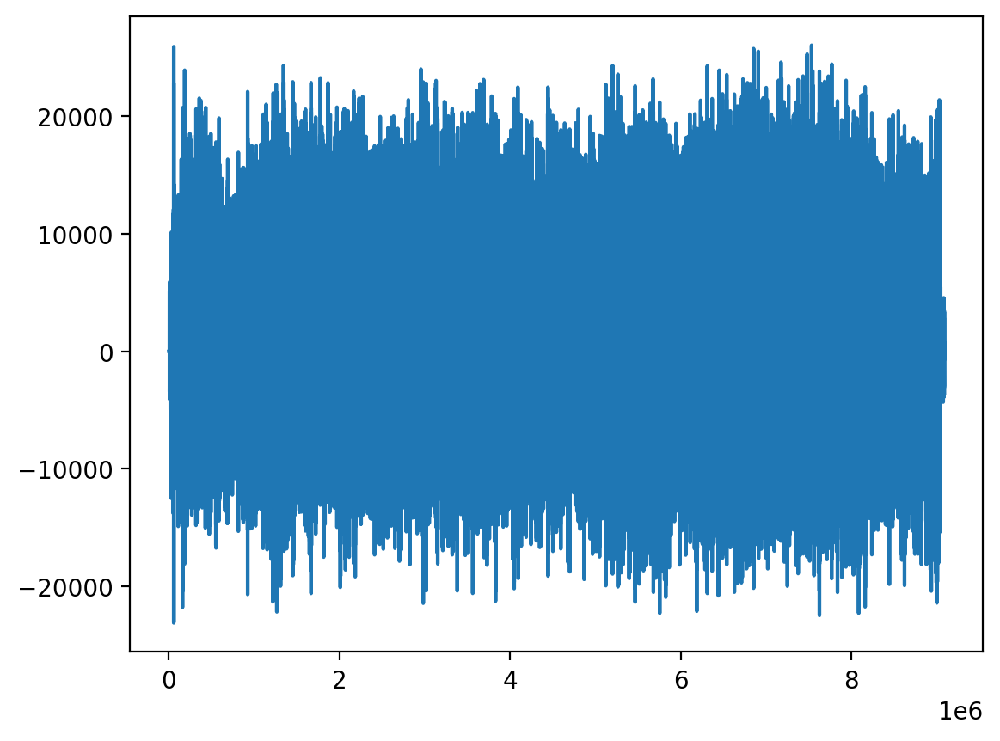

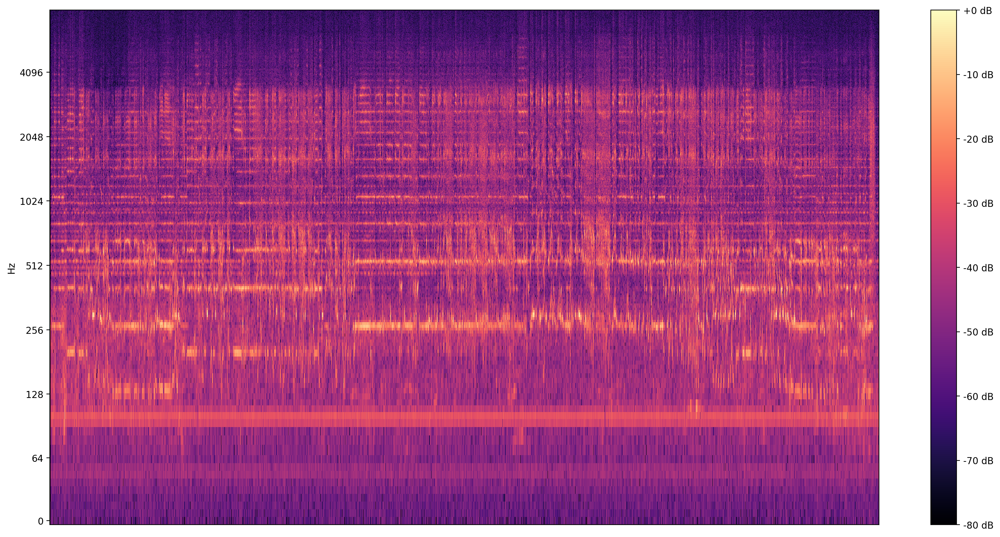

In [8]:
# Converting to the expected format for the model
# in all the input 4 input method before, the uploaded file name is at
# the variable uploaded_file_name


# n_segments = i
# for a in range(n_segments):
#     converted_audio_file = convert_audio_for_model(f"{SAVE_PATH}segment_{a+1}.mp3")
#     sample_rate, audio_samples = wavfile.read(converted_audio_file, 'rb')
#     # We can visualize the audio as a waveform.
#     _ = plt.plot(audio_samples)
#     plot_stft(audio_samples / MAX_ABS_INT16 , sample_rate=EXPECTED_SAMPLE_RATE)
#     plt.show()


converted_audio_file = convert_audio_for_model(AUDIO_FILE_PATH)
sample_rate, audio_samples = wavfile.read(converted_audio_file, 'rb')
# We can visualize the audio as a waveform.
_ = plt.plot(audio_samples)
plot_stft(audio_samples / MAX_ABS_INT16 , sample_rate=EXPECTED_SAMPLE_RATE)
plt.show()

In [9]:
import noisereduce as nr
# load data
rate, data = wavfile.read("download/converted_audio.wav")
# perform noise reduction
reduced_noise = nr.reduce_noise(y=data, sr=rate)
wavfile.write("download/reduced_noise.wav", rate, reduced_noise)

In [10]:
# Loading audio samples from the wav file:
sample_rate, audio_samples = wavfile.read(converted_audio_file, 'rb')

# Show some basic information about the audio.
duration = len(audio_samples)/sample_rate
print(f'Sample rate: {sample_rate} Hz')
print(f'Total duration: {duration:.2f}s')
print(f'Size of the input: {len(audio_samples)}')


Sample rate: 16000 Hz
Total duration: 568.01s
Size of the input: 9088160


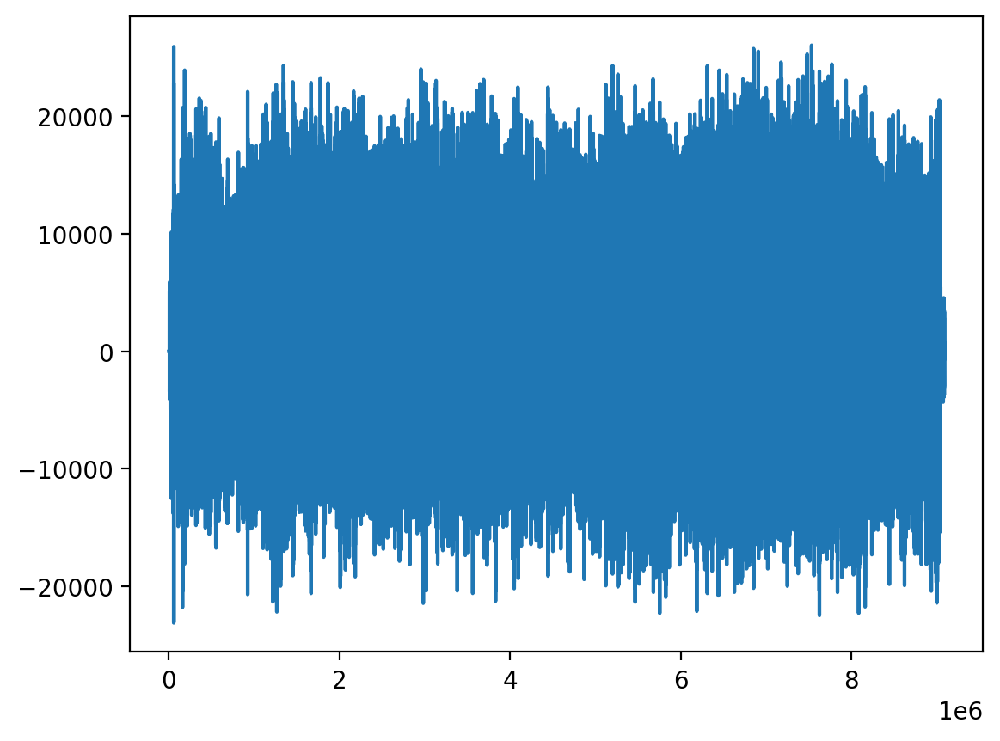

In [11]:
import matplotlib.pyplot as plt

# We can visualize the audio as a waveform.
_ = plt.plot(audio_samples)

In [12]:
audio_samples = audio_samples / float(MAX_ABS_INT16)

In [13]:
import tensorflow as tf
import tensorflow_hub as hub

# Loading the SPICE model is easy:
model = hub.load("https://tfhub.dev/google/spice/2")

2024-04-07 17:19:48.825429: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-04-07 17:19:48.945608: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-04-07 17:19:49.380421: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-07 17:19:50.595614: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


2024-04-07 17:19:51.945199: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-04-07 17:19:51.945545: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


2024-04-07 17:19:52.977852: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 581664768 exceeds 10% of free system memory.
2024-04-07 17:19:53.283360: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 581664768 exceeds 10% of free system memory.
2024-04-07 17:19:53.535591: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 581664768 exceeds 10% of free system memory.
2024-04-07 17:19:53.920065: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 581664768 exceeds 10% of free system memory.


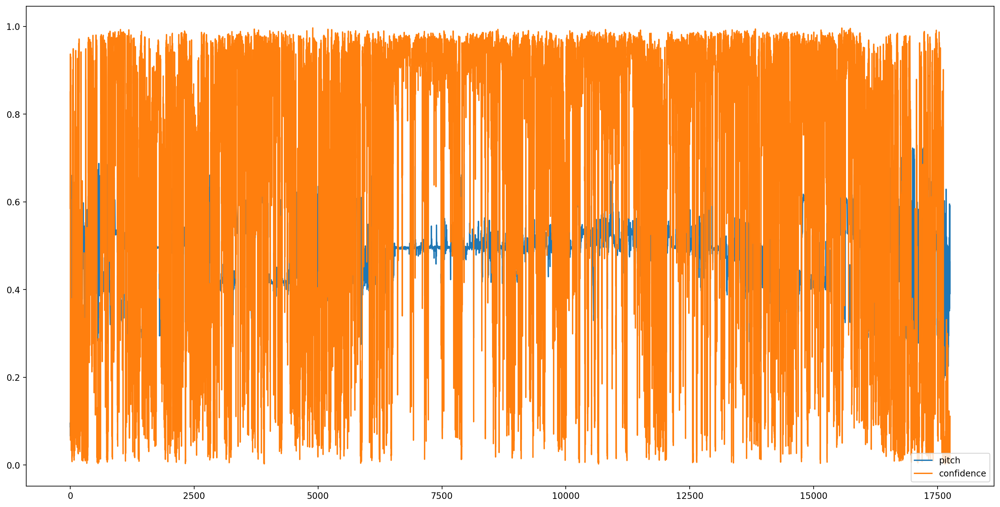

In [14]:
# We now feed the audio to the SPICE tf.hub model to obtain pitch and uncertainty outputs as tensors.
model_output = model.signatures["serving_default"](tf.constant(audio_samples, tf.float32))

pitch_outputs = model_output["pitch"]
uncertainty_outputs = model_output["uncertainty"]

# 'Uncertainty' basically means the inverse of confidence.
confidence_outputs = 1.0 - uncertainty_outputs

fig, ax = plt.subplots()
fig.set_size_inches(20, 10)
plt.plot(pitch_outputs, label='pitch')
plt.plot(confidence_outputs, label='confidence')
plt.legend(loc="lower right")
plt.show()

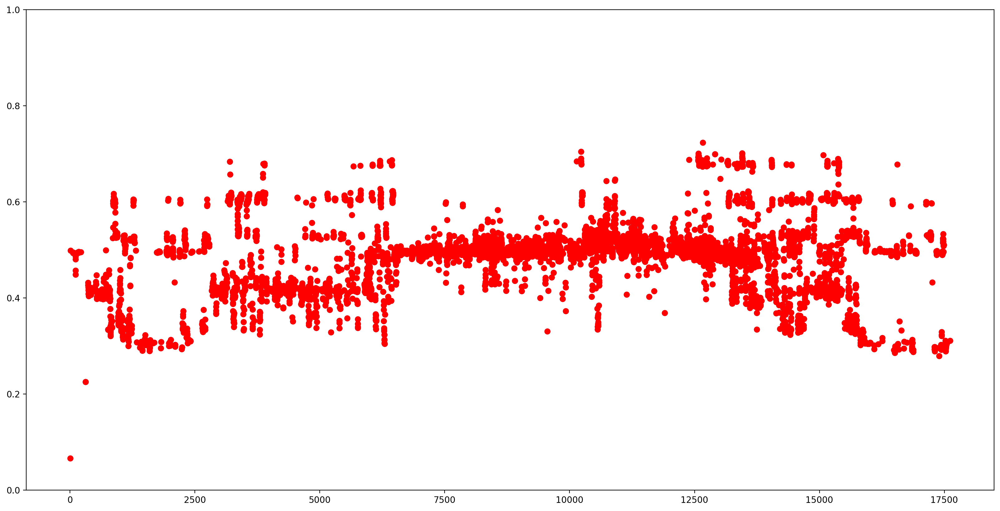

In [15]:
confidence_outputs = list(confidence_outputs)
pitch_outputs = [ float(x) for x in pitch_outputs]

indices = range(len (pitch_outputs))
confident_pitch_outputs = [ (i,p)  
  for i, p, c in zip(indices, pitch_outputs, confidence_outputs) if  c >= 0.9  ]
confident_pitch_outputs_x, confident_pitch_outputs_y = zip(*confident_pitch_outputs)

fig, ax = plt.subplots()
fig.set_size_inches(20, 10)
ax.set_ylim([0, 1])
plt.scatter(confident_pitch_outputs_x, confident_pitch_outputs_y, )
plt.scatter(confident_pitch_outputs_x, confident_pitch_outputs_y, c="r")

plt.show()

In [16]:
def output2hz(pitch_output):
  # Constants taken from https://tfhub.dev/google/spice/2
  PT_OFFSET = 25.58
  PT_SLOPE = 63.07
  FMIN = 10.0;
  BINS_PER_OCTAVE = 12.0;
  cqt_bin = pitch_output * PT_SLOPE + PT_OFFSET;
  return FMIN * 2.0 ** (1.0 * cqt_bin / BINS_PER_OCTAVE)

confident_pitch_values_hz = [ output2hz(p) for p in confident_pitch_outputs_y ]

  return mcm.get_cmap(cmap_seq)



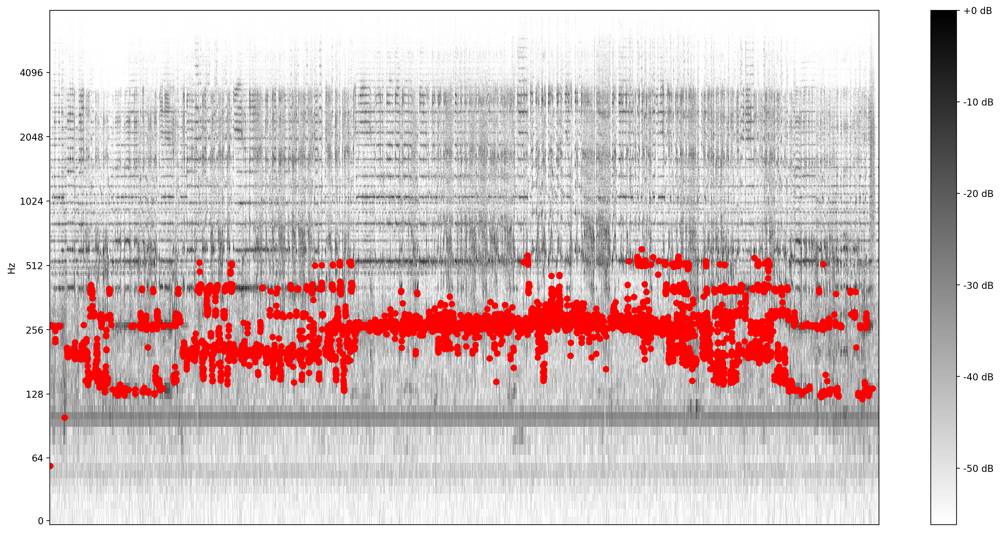

In [17]:
plot_stft(audio_samples / MAX_ABS_INT16 , 
          sample_rate=EXPECTED_SAMPLE_RATE, show_black_and_white=True)
# Note: conveniently, since the plot is in log scale, the pitch outputs 
# also get converted to the log scale automatically by matplotlib.
plt.scatter(confident_pitch_outputs_x, confident_pitch_values_hz, c="r")

plt.show()

In [18]:
pitch_outputs_and_rests = [
    output2hz(p) if c >= 0.9 else 0
    for i, p, c in zip(indices, pitch_outputs, confidence_outputs)
]

In [19]:
import statistics

A4 = 440
C0 = A4 * pow(2, -4.75)
note_names = ["C", "C#", "D", "D#", "E", "F", "F#", "G", "G#", "A", "A#", "B"]

def hz2offset(freq):
  # This measures the quantization error for a single note.
  if freq == 0:  # Rests always have zero error.
    return None
  # Quantized note.
  h = round(12 * math.log2(freq / C0))
  return 12 * math.log2(freq / C0) - h


# The ideal offset is the mean quantization error for all the notes
# (excluding rests):
offsets = [hz2offset(p) for p in pitch_outputs_and_rests if p != 0]
print("offsets: ", offsets)

ideal_offset = statistics.mean(offsets)
print("ideal offset: ", ideal_offset)

offsets:  [0.2414509353911427, -0.4887006439143846, 0.26675353245194344, 0.19477676616365613, 0.2644566215699484, 0.25550957099849825, 0.16804839239770786, 0.34131986634190525, -0.1251878081137363, 0.3592331411069125, -0.27848273678366553, 0.25802639887983503, 0.15612212435657824, 0.2701199542110757, 0.22713463918621812, 0.3473390154665239, 0.22280772523338044, 0.33663074926788283, 0.28968316898996704, 0.23597455070669326, 0.2922413487857085, 0.30384432004149176, 0.2868543221181241, 0.29105718032772643, 0.24768521325047743, 0.27522840769346146, 0.263435226542299, -0.026026294665982164, -0.3815813325220816, -0.30091690494363377, -0.2884098304683391, 0.3064485474055516, -0.17582003398482726, -0.458016775684996, -0.21603665037696373, 0.043119556469278564, 0.23450937376673409, 0.3832841636365174, 0.40447701976950867, -0.4992707605535287, 0.3529074232404952, -0.42913415445629965, -0.39952242447679254, -0.3493193207556473, 0.4926731346672284, 0.47973374472314845, -0.40286253138130235, -0.447

In [20]:
def quantize_predictions(group, ideal_offset):
  # Group values are either 0, or a pitch in Hz.
  non_zero_values = [v for v in group if v != 0]
  zero_values_count = len(group) - len(non_zero_values)

  # Create a rest if 80% is silent, otherwise create a note.
  if zero_values_count > 0.8 * len(group):
    # Interpret as a rest. Count each dropped note as an error, weighted a bit
    # worse than a badly sung note (which would 'cost' 0.5).
    return 0.51 * len(non_zero_values), "Rest"
  else:
    # Interpret as note, estimating as mean of non-rest predictions.
    h = round(
        statistics.mean([
            12 * math.log2(freq / C0) - ideal_offset for freq in non_zero_values
        ]))
    octave = h // 12
    n = h % 12
    note = note_names[n] + str(octave)
    # Quantization error is the total difference from the quantized note.
    error = sum([
        abs(12 * math.log2(freq / C0) - ideal_offset - h)
        for freq in non_zero_values
    ])
    return error, note


def get_quantization_and_error(pitch_outputs_and_rests, predictions_per_eighth,
                               prediction_start_offset, ideal_offset):
  # Apply the start offset - we can just add the offset as rests.
  pitch_outputs_and_rests = [0] * prediction_start_offset + \
                            pitch_outputs_and_rests
  # Collect the predictions for each note (or rest).
  groups = [
      pitch_outputs_and_rests[i:i + predictions_per_eighth]
      for i in range(0, len(pitch_outputs_and_rests), predictions_per_eighth)
  ]

  quantization_error = 0

  notes_and_rests = []
  for group in groups:
    error, note_or_rest = quantize_predictions(group, ideal_offset)
    quantization_error += error
    notes_and_rests.append(note_or_rest)

  return quantization_error, notes_and_rests


best_error = float("inf")
best_notes_and_rests = None
best_predictions_per_note = None

for predictions_per_note in range(20, 65, 1):
  for prediction_start_offset in range(predictions_per_note):

    error, notes_and_rests = get_quantization_and_error(
        pitch_outputs_and_rests, predictions_per_note,
        prediction_start_offset, ideal_offset)

    if error < best_error:      
      best_error = error
      best_notes_and_rests = notes_and_rests
      best_predictions_per_note = predictions_per_note

# At this point, best_notes_and_rests contains the best quantization.
# Since we don't need to have rests at the beginning, let's remove these:
while best_notes_and_rests[0] == 'Rest':
  best_notes_and_rests = best_notes_and_rests[1:]
# Also remove silence at the end.
while best_notes_and_rests[-1] == 'Rest':
  best_notes_and_rests = best_notes_and_rests[:-1]

In [21]:
# Creating the sheet music score.
sc = music21.stream.Score()
# Adjust the speed to match the actual singing.
bpm = 60 * 60 / best_predictions_per_note
print ('bpm: ', bpm)
a = music21.tempo.MetronomeMark(number=bpm)
sc.insert(0,a)

for snote in best_notes_and_rests:   
    d = 'half'
    if snote == 'Rest':      
      sc.append(music21.note.Rest(type=d))
    else:
      sc.append(music21.note.Note(snote, type=d))

bpm:  180.0


In [22]:
from IPython.display import display, HTML, Javascript
import json, random

def showScore(score):
    xml = open(score.write('musicxml')).read()
    showMusicXML(xml)

def showMusicXML(xml):
    DIV_ID = "OSMD_div"
    display(HTML('<div id="'+DIV_ID+'">loading OpenSheetMusicDisplay</div>'))
    script = """
    var div_id = %%DIV_ID%%;
    function loadOSMD() { 
        return new Promise(function(resolve, reject){
            if (window.opensheetmusicdisplay) {
                return resolve(window.opensheetmusicdisplay)
            }
            // OSMD script has a 'define' call which conflicts with requirejs
            var _define = window.define // save the define object 
            window.define = undefined // now the loaded script will ignore requirejs
            var s = document.createElement( 'script' );
            s.setAttribute( 'src', "https://cdn.jsdelivr.net/npm/opensheetmusicdisplay@0.7.6/build/opensheetmusicdisplay.min.js" );
            //s.setAttribute( 'src', "/custom/opensheetmusicdisplay.js" );
            s.onload=function(){
                window.define = _define
                resolve(opensheetmusicdisplay);
            };
            document.body.appendChild( s ); // browser will try to load the new script tag
        }) 
    }
    loadOSMD().then((OSMD)=>{
        window.openSheetMusicDisplay = new OSMD.OpenSheetMusicDisplay(div_id, {
          drawingParameters: "compacttight"
        });
        openSheetMusicDisplay
            .load(%%data%%)
            .then(
              function() {
                openSheetMusicDisplay.render();
              }
            );
    })
    """.replace('%%DIV_ID%%',DIV_ID).replace('%%data%%',json.dumps(xml))
    display(Javascript(script))
    return

In [23]:
# rendering the music score
# showScore(sc)
print(best_notes_and_rests)

['B3', 'Rest', 'Rest', 'C4', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'G3', 'G3', 'G3', 'G3', 'Rest', 'Rest', 'Rest', 'G#3', 'G3', 'Rest', 'Rest', 'Rest', 'Rest', 'G3', 'G3', 'G3', 'G3', 'A3', 'G3', 'Rest', 'G3', 'G3', 'D#3', 'D#3', 'Rest', 'G4', 'G4', 'D#4', 'D4', 'C4', 'D#3', 'F#3', 'G3', 'D3', 'D3', 'C4', 'D4', 'C#4', 'Rest', 'D3', 'C#3', 'E3', 'B3', 'D3', 'Rest', 'F#4', 'D4', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'C3', 'C3', 'Rest', 'Rest', 'Rest', 'C3', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'C4', 'C4', 'C4', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'C#4', 'C#4', 'A#3', 'Rest', 'Rest', 'Rest', 'C#4', 'C4', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'C4', 'F4', 'Rest', 'D#3', 'Rest', 'D4', 'C#4', 'Rest', 'C#3', 'C#3', 'Rest', 'C#3', 'Rest', 'C4', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'D#3', 'Rest', 'C#4', 'D3', 'Rest', 'D#4', 'D4', 'Rest', 'Rest', 'Rest', 'G3', 'G

In [24]:
import math
import statistics

# Constants for Indian classical music
Sa = 240  # Frequency of Sa (first note)

def hz2offset_indian(freq):
    # This function calculates the quantization error for a single note in Indian classical music.
    if freq == 0:  # Rests always have zero error.
        return None
    # Quantized note.
    h = round(12 * math.log2(freq / Sa))
    return 12 * math.log2(freq / Sa) - h

# Example list of pitch outputs for Sa Re Ga Ma Pa Da Ni with octave numbers
pitch_outputs_indian = {
    "Sa": [240, 480, 960],  # Frequencies for Sa in different octaves
    "Re": [270, 540, 1080],  # Frequencies for Re in different octaves
    "Ga": [300, 600, 1200],  # Frequencies for Ga in different octaves
    "Ma": [320, 640, 1280],  # Frequencies for Ma in different octaves
    "Pa": [360, 720, 1440],  # Frequencies for Pa in different octaves
    "Dha": [400, 800, 1600],  # Frequencies for Dha in different octaves
    "Ni": [450, 900, 1800]  # Frequencies for Ni in different octaves
}

# Calculate offsets for Sa Re Ga Ma Pa Da Ni notes in different octaves
offsets_indian = {}
for note, frequencies in pitch_outputs_indian.items():
    offsets_indian[note] = [hz2offset_indian(freq) for freq in frequencies]
    print(f"Offsets for {note}:", offsets_indian[note])

# Calculate the ideal offset for each note
ideal_offsets_indian = {}
for note, offsets in offsets_indian.items():
    ideal_offsets_indian[note] = statistics.mean([offset for offset in offsets if offset is not None])
    print(f"Ideal offset for {note}:", ideal_offsets_indian[note])



Offsets for Sa: [0.0, 0.0, 0.0]
Offsets for Re: [0.03910001730774848, 0.03910001730774937, 0.039100017307745816]
Offsets for Ga: [-0.13686286135165204, -0.13686286135165204, -0.13686286135165204]
Offsets for Ma: [-0.019550008653874684, -0.01955000865387646, -0.019550008653872908]
Offsets for Pa: [0.019550008653874684, 0.019550008653872908, 0.019550008653872908]
Offsets for Dha: [-0.15641287000552495, -0.15641287000552495, -0.15641287000552495]
Offsets for Ni: [-0.11731285269777914, -0.11731285269777914, -0.11731285269777914]
Ideal offset for Sa: 0.0
Ideal offset for Re: 0.03910001730774789
Ideal offset for Ga: -0.13686286135165204
Ideal offset for Ma: -0.019550008653874684
Ideal offset for Pa: 0.0195500086538735
Ideal offset for Dha: -0.15641287000552495
Ideal offset for Ni: -0.11731285269777914


In [25]:
def calculate_ideal_offset(pitch_outputs_and_rests, pitch_outputs_indian):
    total_error = 0
    total_count = 0
    
    for note, frequencies in pitch_outputs_indian.items():
        for freq in frequencies:
            closest_freq = min(pitch_outputs_and_rests, key=lambda x: abs(x - freq))
            error = abs(closest_freq - freq)
            total_error += error
            total_count += 1
    
    if total_count == 0:
        return 0  # Handle case where there are no frequencies
    
    ideal_offset = total_error / total_count
    return ideal_offset

# Call the function to calculate the ideal offset
ideal_offset = calculate_ideal_offset(pitch_outputs_and_rests, pitch_outputs_indian)


In [26]:
import math
import statistics

# Constants for Indian classical music
Sa = 240  # Frequency of Sa (first note)
note_names_indian = ["Sa", "Re", "Ga", "Ma", "Pa", "Dha", "Ni"]

def quantize_predictions(group, ideal_offset):
    non_zero_values = [v for v in group if v != 0]
    zero_values_count = len(group) - len(non_zero_values)

    if zero_values_count > 0.8 * len(group):
        return 0.51 * len(non_zero_values), "Rest"
    elif not non_zero_values:
        return 0, "Rest"  # Return 0 error and Rest if all values are zero
    else:
        closest_notes = []
        for freq in non_zero_values:
            closest_note = min(pitch_outputs_indian, key=lambda note: min(abs(freq - f) for f in pitch_outputs_indian[note]))
            closest_notes.append(closest_note)

        note_counts = {note: closest_notes.count(note) for note in closest_notes}
        most_common_note = max(note_counts, key=note_counts.get)
        
        # Find the closest frequency in the pitch_outputs_indian list
        closest_freq = min(pitch_outputs_indian[most_common_note], key=lambda x: abs(x - freq))
        # Get the index of the closest frequency
        closest_freq_index = pitch_outputs_indian[most_common_note].index(closest_freq)
        octave = closest_freq_index + 1  # Determine the octave of the closest frequency
        note_name = f"{most_common_note}{octave}"
        error = sum(abs(freq - closest_freq - ideal_offset) for freq in non_zero_values)
        return error, note_name



def get_quantization_and_error(pitch_outputs_and_rests, predictions_per_eighth, prediction_start_offset, ideal_offset):
    pitch_outputs_and_rests = [0] * prediction_start_offset + pitch_outputs_and_rests
    groups = [pitch_outputs_and_rests[i:i + predictions_per_eighth] for i in range(0, len(pitch_outputs_and_rests), predictions_per_eighth)]

    quantization_error = 0
    notes_and_rests = []
    
    for group in groups:
        error, note_or_rest = quantize_predictions(group, ideal_offset)
        quantization_error += error
        notes_and_rests.append(note_or_rest)
    
    return quantization_error, notes_and_rests

# Calculate ideal_offset
ideal_offset = calculate_ideal_offset(pitch_outputs_and_rests, pitch_outputs_indian)

best_error = float("inf")
best_notes_and_rests = None
best_predictions_per_note = None

for predictions_per_note in range(20, 65, 1):
    for prediction_start_offset in range(predictions_per_note):
        error, notes_and_rests = get_quantization_and_error(pitch_outputs_and_rests, predictions_per_note, prediction_start_offset, ideal_offset)

        if error < best_error:
            best_error = error
            best_notes_and_rests = notes_and_rests
            best_predictions_per_note = predictions_per_note

while best_notes_and_rests[0] == 'Rest':
    best_notes_and_rests = best_notes_and_rests[1:]
while best_notes_and_rests[-1] == 'Rest':
    best_notes_and_rests = best_notes_and_rests[:-1]


In [27]:
# Adjust the speed to match the actual singing.
bpm = 60 * 60 / best_predictions_per_note
print('bpm:', bpm)
a = music21.tempo.MetronomeMark(number=bpm)
sc.insert(0, a)

# Define a mapping from Indian classical note names to Western note names
indian_to_western_mapping = {
    'Sa': 'C',
    'Re': 'D',
    'Ga': 'E',
    'Ma': 'F',
    'Pa': 'G',
    'Dha': 'A',
    'Ni': 'B'
}

for snote in best_notes_and_rests:
    d = 'half'
    if snote == 'Rest':
        sc.append(music21.note.Rest(type=d))
    else:
        # Extract the note name and octave from the Indian classical note representation
        note_name, octave = snote[:-1], int(snote[-1])
        # Convert Indian classical note name to Western note name
        western_note_name = indian_to_western_mapping[note_name]
        # Create the music21 note object
        note_obj = music21.note.Note(f"{western_note_name}{octave}", type=d)
        sc.append(note_obj)


bpm: 171.42857142857142


In [28]:
# rendering the music score
# showScore(sc)
print(best_notes_and_rests)

['Re1', 'Rest', 'Rest', 'Rest', 'Rest', 'Re1', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Sa1', 'Sa1', 'Sa1', 'Rest', 'Sa1', 'Rest', 'Rest', 'Sa1', 'Rest', 'Rest', 'Rest', 'Rest', 'Sa1', 'Sa1', 'Sa1', 'Rest', 'Sa1', 'Rest', 'Rest', 'Sa1', 'Sa1', 'Sa1', 'Rest', 'Dha1', 'Dha1', 'Dha1', 'Ga1', 'Ga1', 'Sa1', 'Sa1', 'Sa1', 'Sa1', 'Sa1', 'Ga1', 'Re1', 'Re1', 'Rest', 'Sa1', 'Sa1', 'Sa1', 'Sa1', 'Rest', 'Rest', 'Ga1', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Sa1', 'Sa1', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Re1', 'Re1', 'Re1', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Re1', 'Re1', 'Rest', 'Rest', 'Rest', 'Rest', 'Re1', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Re1', 'Dha1', 'Rest', 'Sa1', 'Sa1', 'Ga1', 'Re1', 'Rest', 'Rest', 'Rest', 'Rest', 'Sa1', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Rest', 'Sa1', 'Rest', 'Re1', 'Sa1', 'Rest', 'Ga1', 'Rest', 'Rest'

In [30]:
import librosa
import numpy as np
import mir_eval

# Load audio file
audio_path = 'download/audio.mp3'
y, sr = librosa.load(audio_path)

# Extract melody using Librosa's melody function
melody, _ = librosa.core.piptrack(y=y, sr=sr)

# Convert pitch contour to MIDI notes
midi_notes = librosa.hz_to_midi(melody[melody > 0])

# Define a function to detect beats
def detect_beats(y, sr):
    tempo, beats = librosa.beat.beat_track(y=y, sr=sr)
    return beats

# Detect beats in the audio
beats = detect_beats(y, sr)

# Convert beat timings to time stamps
beat_times = librosa.frames_to_time(beats, sr=sr)

# Extract chroma features for harmonic content
chromagram = librosa.feature.chroma_cqt(y=y, sr=sr)

# Identify tonal center using chroma features
tonal_center = np.argmax(np.mean(chromagram, axis=1))

# Print extracted information
print("Tonal Center:", tonal_center)
print("Melody (MIDI notes):", midi_notes)
print("Beats (time stamps in seconds):", beat_times)


  smooth_boe = scipy.signal.convolve(localscore[beats], scipy.signal.hann(5), "same")



Tonal Center: 7
Melody (MIDI notes): [ 49.92738   50.762157  49.828644 ... 107.19056  107.189186 107.200836]
Beats (time stamps in seconds): [4.17959184e-01 9.05578231e-01 1.36997732e+00 ... 5.65963175e+02
 5.66427574e+02 5.66984853e+02]
